In [1]:
using Pkg

projectdir_static = dirname(Base.active_project())

projectdirx(args...) = joinpath(projectdir_static, args...)

# Generate functions to access the path of default subdirectories.
for dir_type ∈ ("data", "src", "plots", "scripts", "papers")
    function_name = Symbol(dir_type * "dirx")
    @eval begin
        $function_name(args...) = projectdirx($dir_type, args...)
    end
end

using DrWatson

@quickactivate "TissueRigidity"
 
projectname()

"TissueRigidity"

In [29]:
using DifferentialEquations
using StatsBase
using CairoMakie
using XLSX
using DataFrames
using Optimization, OptimizationPolyalgorithms, SciMLSensitivity,OptimizationOptimJL,OptimizationBBO,OptimizationNOMAD

In [55]:
include(srcdirx("Plotting&Utility.jl"))
include(srcdirx("FittingFunctions.jl"))
# include(srcdirx("old/FittingFunctions_old_cmax.jl"))

include(srcdirx("NodalLefty_E.jl"))

exp_name = "NodalLefty_DiffusionDominated"

include(srcdirx("ExperimentSetups/" * exp_name * ".jl"))

include(scriptsdirx("LoadData.jl"));

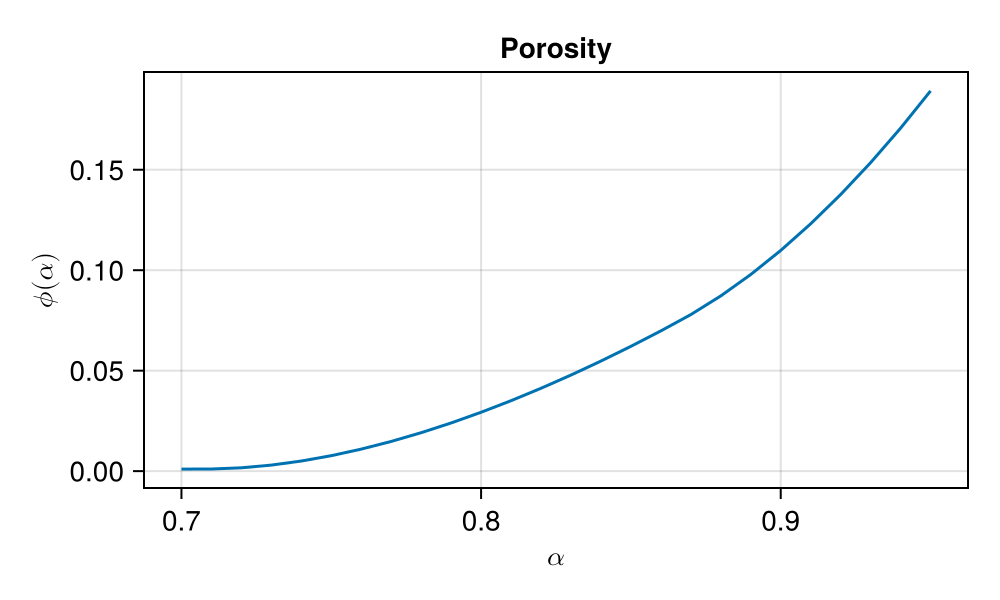

In [31]:
α_range = 0.7:0.01:0.95

fig = Figure(size = (500,300))
ax1 = Axis(fig[1,1],title = "Porosity",ylabel = L"\phi(\alpha)",xlabel = L"\alpha")

lines!(ax1, α_range,[ϕ(α) for α in α_range])

fig

In [32]:
const pv_orig = [DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0]
# pv_orig = load(datadirx() * "/sims/NodalLefty_DiffusionDominated_OptParmas.jld2")["OptimalParam"][3]

p_orig,p_cp_orig,p_lm_orig = get_params(pv_orig)

tspan = (0,Inf)

u0 = ones(Nc,4)

u0[:,1] .= 1e-10
u0[:,2] .= 1e-10
u0[:,3] .= 0.
u0[:,4] .= α0

prob = ODEProblem(nodal_lefty_spatial_diff!,u0,tspan,p_orig)

lb = copy(pv_orig)
ub = copy(pv_orig)

lb[1:2] = 0.9 .* lb[1:2]
ub[1:2] = 1.1 .* ub[1:2]

lb[3:end] = (1 - γ) .* lb[3:end]
ub[3:end] = (1 + γ) .* ub[3:end];

In [33]:
p_orig

(DN0 = 1.95, DL0 = 15.0, kN0 = 1.2499999999999999e-6, kL0 = 7.5e-7, kE = 0.0005, kNL = 10.0, σN0 = 0.01, σL0 = 0.012, Na = 31.6228, NL = 200.0, NE = 23.717100000000002, mN = 2, mL = 8, mNL = 2, LN = 15.8114, s0 = 5.0)

In [34]:
# orig_metrics = get_summary_metrics(pv_orig,prob,data,alpha_data)

orig_metrics = get_summary_metrics(pv_orig,prob,data,alpha_data,0.2)

(wt_t0 = 1753.4949814845907, cp_t0 = 3005.991396830727, wt_xMax = 66.22073578595318, cp_xMax = 112.37458193979933, lm_xMax = 300.0, wt_d0 = 0.07575757575757576, cp_d0 = 0.41964285714285715, lm_d0 = 1.0, xmax_peak_ratio = 1.7142857142857144, xmax_mse = (0.21064114245139287, 1.0334191277814366), xmax_mse_half = (0.21064114245139287, 0.22395705778657451), alpha_mse = 0.003199847950954466, cp_lprod_t0 = 1753.4949814845907, wt_lprod_t0 = 1252.4964153461362, retcodes = (SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated))

In [35]:
t_check = [0,15,40,65,90,115,140] .* 60

# t_check = alpha_data_times_norm[2:end] .* orig_metrics[:wt_t0]

sol_profiles = solve(prob, p = p_orig, FBDF(),abstol = 1e-11,reltol = 1e-9, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u), saveat = t_check);
sol_profiles_cp = solve(prob, p = p_cp_orig, FBDF(),abstol = 1e-11,reltol = 1e-9, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u), saveat = t_check);

dyn_N = [sol[:,1] for sol in sol_profiles.u[1:length(t_check)]]
dyn_L = [sol[:,2] for sol in sol_profiles.u[1:length(t_check)]];

dyn_N_cp = [sol[:,1] for sol in sol_profiles_cp.u[1:length(t_check)]];

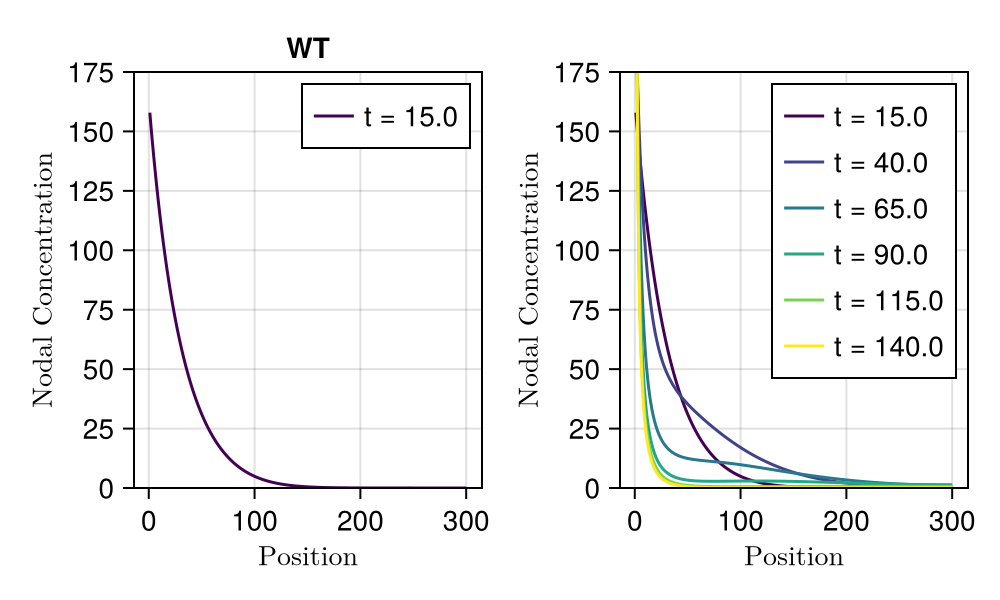

In [36]:
fig = Figure(size = (500,300))

ax1 = Axis(fig[1,1], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}", title = "WT")

lines!(ax1,dyn_N[2],label =   "t = " * string(t_check[2] / 60),colormap = :viridis, color = 1, colorrange = (1,length(t_check)-1))

ax2 = Axis(fig[1,2], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}" )

for (i,N) in enumerate(dyn_N[2:end])
    lines!(ax2,N,label = "t = " * string(t_check[i+1] / 60),colormap = :viridis, color = i, colorrange = (1,length(t_check)-1))
end

axislegend(ax1,position = :rt)
axislegend(ax2,position = :rt)


# xlims!(ax1,0,150.)
# xlims!(ax2,0,150.)

ylims!(ax1,0,175.)
ylims!(ax2,0,175.)

# ax1.yticks = (0:50:300,string.(0:50:300))
# ax2.yticks = (0:50:300,string.(0:50:300))

save(plotsdir(exp_name * "/OrigFits/NodalProfiles_WT.pdf"),fig)

fig

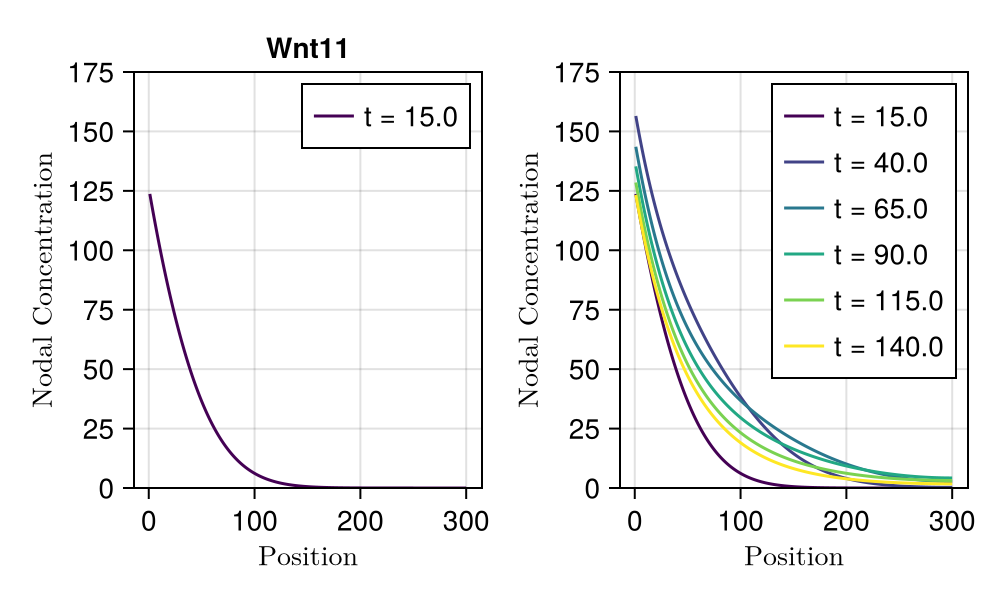

In [37]:
fig = Figure(size = (500,300))

ax1 = Axis(fig[1,1], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}", title = "Wnt11")

lines!(ax1,dyn_N_cp[2],label =   "t = " * string(t_check[2] / 60),colormap = :viridis, color = 1, colorrange = (1,length(t_check)-1))

ax2 = Axis(fig[1,2], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}" )

for (i,N) in enumerate(dyn_N_cp[2:end])
    lines!(ax2,N,label = "t = " * string(t_check[i+1] / 60),colormap = :viridis, color = i, colorrange = (1,length(t_check)-1))
end

axislegend(ax1,position = :rt)
axislegend(ax2,position = :rt)


# xlims!(ax1,0,150.)
# xlims!(ax2,0,150.)

ylims!(ax1,0,175.)
ylims!(ax2,0,175.)

# ax1.yticks = (0:50:300,string.(0:50:300))
# ax2.yticks = (0:50:300,string.(0:50:300))

save(plotsdir(exp_name * "/OrigFits/NodalProfiles_Wnt11.pdf"),fig)

fig

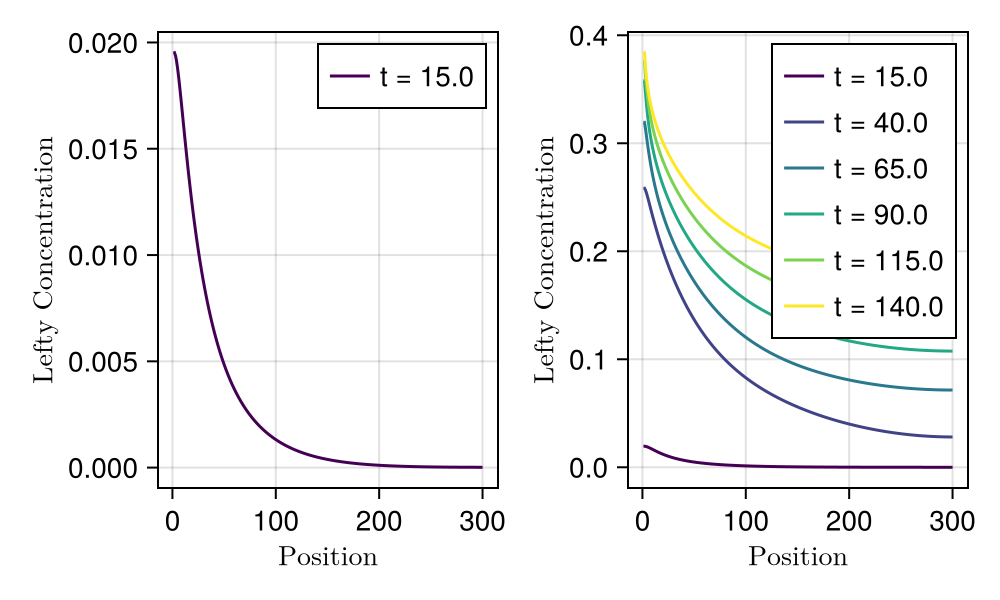

In [38]:
fig = Figure(size = (500,300))

ax1 = Axis(fig[1,1], xlabel = L"\text{Position}", ylabel= L"\text{Lefty Concentration}" )

lines!(ax1,dyn_L[2],label ="t = " * string(t_check[2] / 60),colormap = :viridis, color = 1, colorrange = (1,length(t_check)-1))

ax2 = Axis(fig[1,2], xlabel = L"\text{Position}", ylabel= L"\text{Lefty Concentration}" )

for (i,N) in enumerate(dyn_L[2:end])
    lines!(ax2,N,label = "t = " * string(t_check[i+1] / 60),colormap = :viridis, color = i, colorrange = (1,length(t_check)-1))
end

axislegend(ax1,position = :rt)
axislegend(ax2,position = :rt)


# ylims!(ax1,0,100.)
# ylims!(ax2,0,100.)
# ax1.yticks = (0:50:300,string.(0:50:300))
# ax2.yticks = (0:50:300,string.(0:50:300))

save(plotsdir(exp_name * "/OrigFits/LeftyProfiles.pdf"),fig)

fig

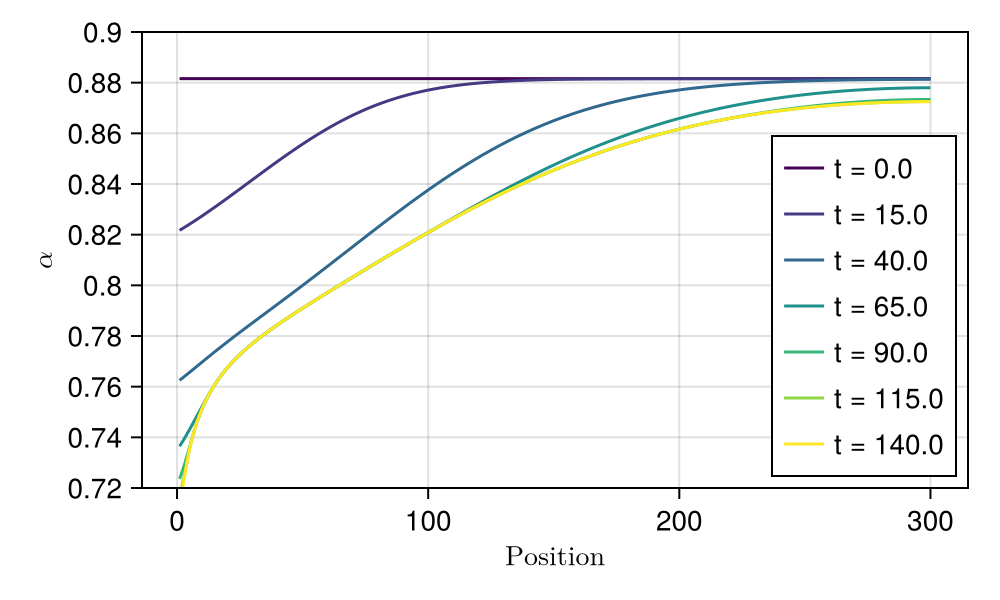

In [39]:
fig = Figure(size = (500,300))

ax1 = Axis(fig[1,1], xlabel = L"\text{Position}", ylabel= L"\alpha" )

dyn_alpha = [sol[:,4] for sol in sol_profiles.u[1:length(t_check)]]

for (i,N) in enumerate(dyn_alpha)
    lines!(ax1,N,label = "t = " * string(t_check[i] / 60),colormap = :viridis, color = i, colorrange = (1,length(t_check)))
end

ylims!(ax1,0.72,0.9)

ax1.yticks = (0.7:0.02:0.9,string.(0.7:0.02:0.9))

axislegend(ax1,position = :rb)

save(plotsdir(exp_name * "/OrigFits/AlphaProfiles.pdf"),fig)

fig

In [40]:
p_orig,p_orig_cp,p_orig_lm,p_orig_ro, p_orig_ro_cp,p_orig_ro_cp_lm = get_params_v1(pv_orig)

sol = solve(prob, p = p_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_cp = solve(prob, p = p_cp_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_lm = solve(prob, p = p_lm_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_ro = solve(prob, p = p_orig_ro, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

sol_ro_cp = solve(prob, p = p_orig_ro_cp, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_ro_cp_lm = solve(prob, p = p_orig_ro_cp_lm, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

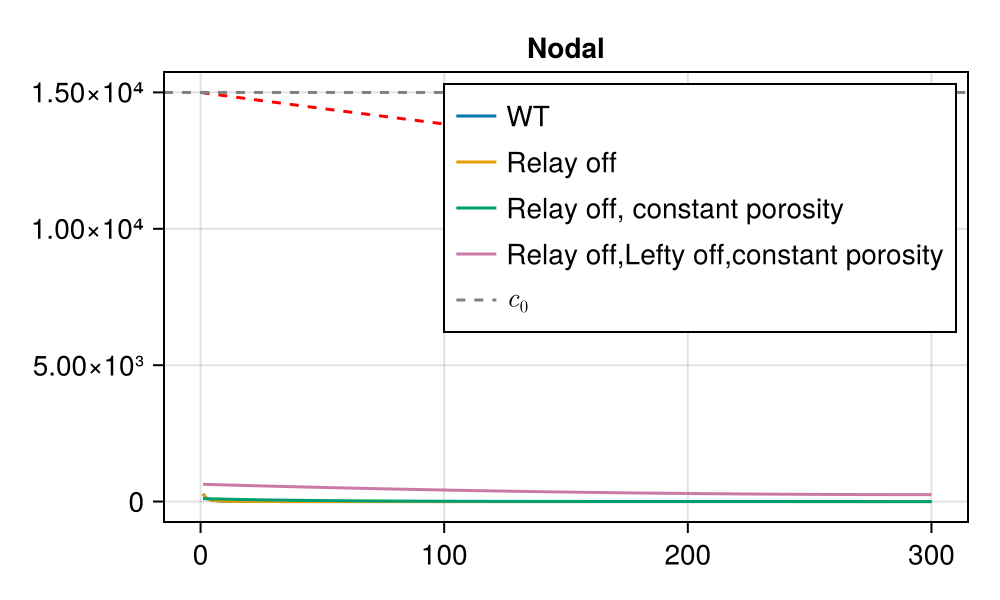

In [41]:
fig = Figure(size = (500,300))
ax = Axis(fig[1,1],title = "Nodal")

lines!(ax,sol.u[end][:,1],label = "WT")
lines!(ax,sol_ro.u[end][:,1],label = "Relay off")
lines!(ax,sol_cp.u[end][:,1],label = "Relay off, constant porosity")
lines!(ax,sol_ro_cp_lm.u[end][:,1],label = "Relay off,Lefty off,constant porosity")
lines!(ax,tissue,y->c0*exp(-y/λ),linestyle = :dash,color = :red)

hlines!(ax,c0, linestyle = :dash, color = :grey,label = L"c_0")

axislegend(ax,position = :rt)

save(plotsdir(exp_name * "/OrigFits/NodalProfiles_Variations.pdf"),fig)

fig

In [42]:
data_metrics = get_exp_summary_metrics(data)

(wt_t0 = 6000.0, cp_t0 = 8400.0, wt_xMax = 63.9966, cp_xMax = 86.59800000000001, wt_d0 = 0.0, cp_d0 = 0.0, lm_d0 = 1.0, xmax_peak_ratio = 1.4, xmax_mse = 0.0, alpha_mse = 0.0)

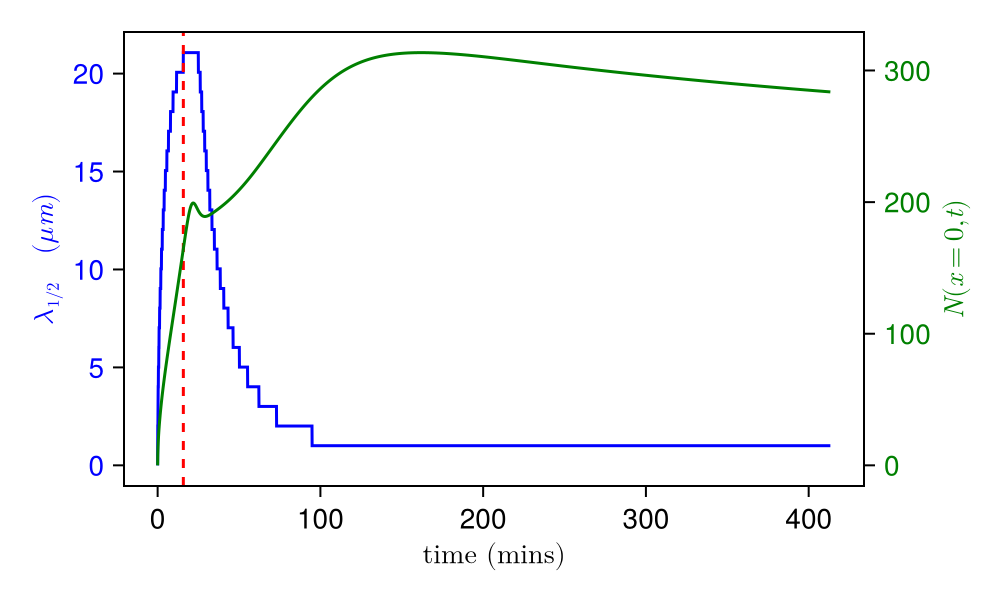

In [43]:
fig = Figure(size = (500,300))

ax = Axis(fig[1,1], xlabel = L"\text{time (mins)}", ylabel= L"\lambda_{1/2} \quad (\mu m)",ygridvisible = false,xgridvisible = false,ylabelcolor = :blue,yticklabelcolor = :blue)
ax_N = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"N(x=0,t)", yaxisposition = :right,ylabelcolor = :green,yticklabelcolor = :green,ygridvisible = false,xgridvisible = false,xticksvisible = false)

hidexdecorations!(ax_N)

sol = solve(prob, p = p_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

N_samp = 5000

λ_trange = LinRange(0.,sol.t[end],N_samp)

N0t = [sol(t)[1,1] for t in λ_trange]

λhalf,λhalf_max_t = get_lambda_half(sol,λ_trange)

c_max = maximum(sol(λhalf_max_t)[:,1])

lines!(ax,λ_trange ./ 60 ,λhalf,color = :blue)

lines!(ax_N,λ_trange ./ 60 ,N0t, color = :green)

vlines!(ax,λhalf_max_t / 60, color = :red, linestyle = :dash)

save(plotsdir(exp_name * "/OrigFits/LambdaHalfOverT.pdf"),fig)

fig

In [44]:
# (t_grid_alpha,dyn_alpha),(t_plot,(level_x_wt_rescaled,level_x_cp_rescaled,level_x_lm_rescaled )),(porosity_dyn,porosity_dyn_cp),c_level = get_alpha_xmax(pv_orig,prob);

(t_grid_alpha,dyn_alpha),(t_plot,(level_x_wt_rescaled,level_x_cp_rescaled,level_x_lm_rescaled )),(porosity_dyn,porosity_dyn_cp),c_level,(sol,sol_cp,sol_lm) = get_alpha_xmax_lambda(pv_orig,prob,0.1);

In [45]:
c_level

16.456604082047427

In [46]:
sol = solve(prob, p = p_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_cp = solve(prob, p = p_cp_orig, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_lm = solve(prob, p = p_lm_orig, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

In [47]:
# porosity_dyn_lm = [mean(ϕ.(sol_lm(t)[1:50,4])) for t in t_plot .* orig_metrics[:wt_t0]];

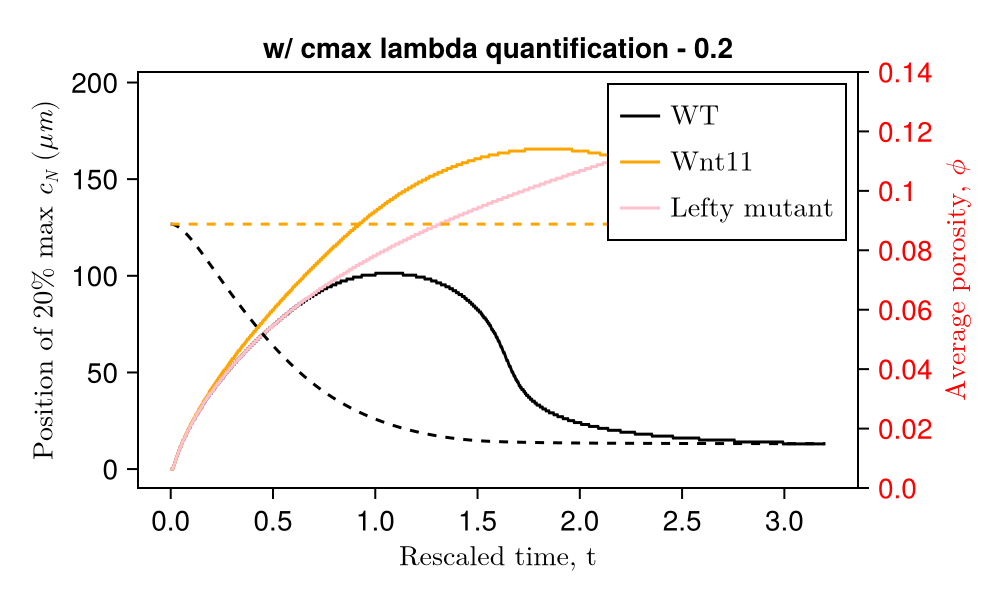

In [48]:
fig = Figure(size = (500,300))

ax = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Position of 20% max } c_N \text{ } (μm) ",ygridvisible = false,xgridvisible = false,title = "w/ cmax lambda quantification - 0.2")
ax_por = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Average porosity, } \phi", yaxisposition = :right,ylabelcolor = :red,yticklabelcolor = :red,ygridvisible = false,xgridvisible = false,xticksvisible = false)

hidexdecorations!(ax_por)

lines!(ax,t_plot,level_x_wt_rescaled,color = :black,label = L"\text{WT}")
lines!(ax,t_plot,level_x_cp_rescaled,color = :orange,label = L"\text{Wnt11}")
lines!(ax,t_plot,level_x_lm_rescaled,color = :pink,label = L"\text{Lefty mutant}")

lines!(ax_por,t_plot,porosity_dyn ,linestyle = :dash,color = :black,label = L"\text{ϕ}")
lines!(ax_por,t_plot,porosity_dyn_cp ,linestyle = :dash,color = :orange,label = L"\text{ϕ}")

# lines!(ax_por,t_plot,porosity_dyn_lm ,linestyle = :dash,color = :pink,label = L"\text{ϕ}")

# lines!(ax,exp_times_times_norm ,data[:,"SLB"],color = :blue)
# lines!(ax,exp_times_times_norm ,data[:,"WT"],color = :black)

axislegend(ax,position = :rt)

ylims!(ax_por,0.,0.14)
# ylims!(ax,0.,300)
ax.xticks = (0:0.5:3.5,string.(0:0.5:3.5))

ax_por.yticks = (0:0.02:0.14,string.(0:0.02:0.14))

save(plotsdir(exp_name * "/OrigFits/Fig3E_xmax_over_time.pdf"),fig)

fig

In [49]:
t_plot_int = LinRange(0,3*orig_metrics[:wt_t0],1000)

1000-element LinRange{Float64, Int64}:
 0.0,5.26575,10.5315,15.7973,21.063,26.3288,…,5244.69,5249.95,5255.22,5260.48

In [50]:
νN_int_cp,νN_int = get_integrated_lefty_prod_values(sol,sol_cp,t_plot_int)

([1.4015624999999976e-98, 4.734298931533808e-14, 1.2962313257518389e-12, 8.83108876301565e-12, 3.425420201472025e-11, 9.773677432444901e-11, 2.2979874542379254e-10, 4.729219079742567e-10, 8.830479747348009e-10, 1.5309915918059364e-9  …  0.0037689414772804656, 0.003762062923853428, 0.0037552003648495154, 0.003748353770954124, 0.003741523112885321, 0.0037347083610313283, 0.0037279094850992023, 0.0037211264547548015, 0.003714359239707363, 0.003707607809709542], [1.4015624999999976e-98, 4.7472878656485796e-14, 1.3054629390155537e-12, 8.938295656811862e-12, 3.485786768271816e-11, 1.0003234684311492e-10, 2.3661907254914384e-10, 4.900243789361984e-10, 9.209412280834626e-10, 1.6073945520560982e-9  …  0.012717994802580115, 0.012717943361085107, 0.012717879866588743, 0.01271780439100326, 0.012717716991334223, 0.012717617725602268, 0.012717506636988053, 0.012717383777150726, 0.012717249178669543, 0.012717102885434413])

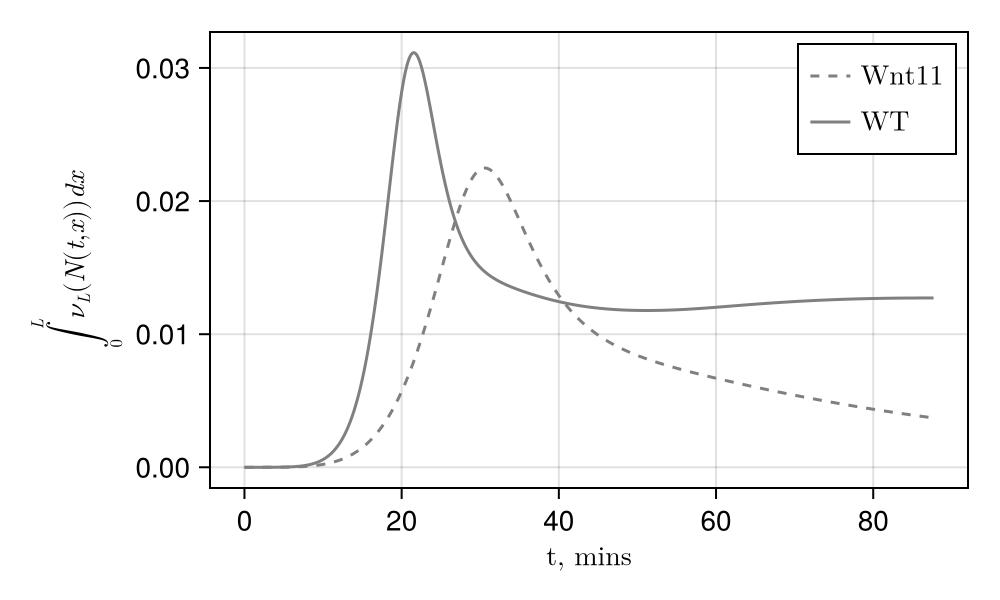

In [51]:
fig = Figure(size = (500,300))
ax = Axis(fig[1,1], xlabel = L"\text{t, mins}", ylabel= L"\int_0^L ν_L(N(t,x)) dx" )

lines!(ax,t_plot_int./ 60,νN_int_cp,linestyle = :dash,color = :grey, label = L"\text{Wnt11}")
lines!(ax,t_plot_int./ 60,νN_int,color = :grey, label = L"\text{WT}")

# xlims!(ax,0.,100)

# ylims!(ax,0.,0.16)

axislegend(ax,position = :rt)

save(plotsdir(exp_name * "/OrigFits/Fig4h_Integrated_Lprod_over_Time.pdf"),fig)

fig

In [52]:
# pv_orig = [DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0]

In [80]:
γ = 0.99

lb = copy(pv_orig)
ub = copy(pv_orig)

lb[1:2] = 0.9 .* lb[1:2]
ub[1:2] = 1.1 .* ub[1:2]

# knl , sigma_n not large enough

lb[3:end] = 0.5 .* lb[3:end]
ub[3:end] = 2 .* ub[3:end];

lb[6] = 1.
ub[6] = 500.

j = 1.

lb_pow = copy(pv_orig)
ub_pow = copy(pv_orig)

lb_pow[1:2] = 0.9 .* lb_pow[1:2]
ub_pow[1:2] = 1.1 .* ub_pow[1:2]

lb_pow[3:end] = 10^(-j) .* lb_pow[3:end]
ub_pow[3:end] = 10^(j) .* ub_pow[3:end];

lb_pow[6] = 50.
ub_pow[6] = 1000

lb_pow[end] = 4.99
ub_pow[end] = 5.01

lb_pow1 = vcat(lb_pow1,[0.1])
ub_pow1 = vcat(ub_pow1,[0.3])

13-element Vector{Float64}:
    2.145
   16.5
    1.2499999999999999e-5
    7.5e-6
    0.005
 1000.0
    0.1
    0.12
  316.228
 2000.0
  237.17100000000002
  158.114
    5.01

In [81]:
pv_start = copy(pv_orig)

pv_start[6] = 75.

pv_start1 = vcat(pv_start,[0.2])

check_inbounds(pv_start,lb_pow,ub_pow)

check_inbounds(pv_start1,lb_pow1,ub_pow1)

(true, Any[])

In [82]:
ro,obj = optimize_params(prob,0.2,pv_start,lb_pow,ub_pow,100,false,true)

1   0.136382


14   0.135549


17   0.124902


29   0.117038


30   0.090552


51   0.087196


79   0.083361


87   0.083259


A termination criterion is reached: Maximum number of blackbox evaluations (Eval Global) 100

Best feasible solution:     #10972 ( 2.145 16 1.125e-05 6.75e-06 0.00048 255 0.041 0.112 61.6228 200 2.37171 55.8114 4.99 )	Evaluation OK	 f =   0.08325899999999999967	 h =   0                     

Best infeasible solution:   Undefined.

Blackbox evaluations:         100
Total model evaluations:      11428
Cache hits:                   5
Total number of evaluations:  105


([2.145, 16.0, 1.125e-5, 6.75e-6, 0.00048, 255.0, 0.041, 0.112, 61.6228, 200.0, 2.37171, 55.81139999999999, 4.99], 0.083259)

In [157]:
function plot_summary!(fig,pv,prob)

    p_tuple,p_cp_tuple,p_lm_tuple = get_params(pv)

    ax = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Position of 20% max } c_N \text{ } (μm) ",ygridvisible = false,xgridvisible = false,title = "w/ cmax 0.2")
    ax_por = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Average porosity, } \phi", yaxisposition = :right,ylabelcolor = :red,yticklabelcolor = :red,ygridvisible = false,xgridvisible = false,xticksvisible = false)

    (t_grid_alpha,dyn_alpha),(t_plot,(level_x_wt_rescaled,level_x_cp_rescaled,level_x_lm_rescaled )),(porosity_dyn,porosity_dyn_cp),c_level,(sol,sol_cp,sol_lm) = get_alpha_xmax_lambda(pv,prob,0.2);

    hidexdecorations!(ax_por)

    lines!(ax,t_plot,level_x_wt_rescaled,color = :black,label = L"\text{WT}")
    lines!(ax,t_plot,level_x_cp_rescaled,color = :orange,label = L"\text{Wnt11}")
    lines!(ax,t_plot,level_x_lm_rescaled,color = :pink,label = L"\text{Lefty mutant}")

    lines!(ax_por,t_plot,porosity_dyn ,linestyle = :dash,color = :black,label = L"\text{ϕ}")
    lines!(ax_por,t_plot,porosity_dyn_cp ,linestyle = :dash,color = :orange,label = L"\text{ϕ}")

    axislegend(ax,position = :lt)

    ylims!(ax_por,0.,0.14)

    ax.xticks = (0:0.5:3.5,string.(0:0.5:3.5))

    orig_metrics = get_summary_metrics(pv,prob,data,alpha_data,0.2)

    t_plot_int = LinRange(0,3*orig_metrics[:wt_t0],1000)

    νN_int_cp,νN_int = get_integrated_lefty_prod_values(sol,sol_cp,t_plot_int)

    ax = Axis(fig[1,2], xlabel = L"\text{t, mins}", ylabel= L"\int_0^L ν_L(N(t,x)) dx" )

    lines!(ax,t_plot_int./ 60,νN_int_cp,linestyle = :dash,color = :grey, label = L"\text{Wnt11}")
    lines!(ax,t_plot_int./ 60,νN_int,color = :grey, label = L"\text{WT}")
    
    axislegend(ax,position = :rt)

    ax = Axis(fig[1,3], xlabel = L"\text{Position}", ylabel= L"α(t)", title = "Beta = " * string(β) )

    for (n,d) in enumerate(dyn_alpha)
        lines!(ax,alpha_x,d, label = string(alpha_data_times_norm[n])* "* t_wt")
        scatter!(ax,alpha_x,alpha_data[:,n+1])
    end

    axislegend(ax,position = :rb)

    t_check = alpha_data_times_norm[2:end] .* orig_metrics[:wt_t0]

    sol_profiles = solve(prob, p = p_tuple, FBDF(),abstol = 1e-10,reltol = 1e-8, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u), saveat = t_check);
    sol_profiles_cp = solve(prob, p = p_cp_tuple, FBDF(),abstol = 1e-10,reltol = 1e-8, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u), saveat = t_check);

    dyn_N = [sol[:,1] for sol in sol_profiles.u[1:length(t_check)]]
    dyn_L = [sol[:,2] for sol in sol_profiles.u[1:length(t_check)]];

    dyn_N_cp = [sol[:,1] for sol in sol_profiles_cp.u[1:length(t_check)]];
    dyn_L_cp = [sol[:,2] for sol in sol_profiles_cp.u[1:length(t_check)]];

    ax1 = Axis(fig[2,1], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}", title = "WT")

    for (i,N) in enumerate(dyn_N)
        lines!(ax1,N,label = string(alpha_data_times_norm[2:end][i]) * "* t_wt",colormap = :viridis, color = i, colorrange = (1,length(t_check)))
    end

    axislegend(ax1,position = :rt)

    ax2 = Axis(fig[2,2], xlabel = L"\text{Position}", ylabel= L"\text{Nodal Concentration}", title = "Wnt11")

    for (i,N) in enumerate(dyn_N_cp[2:end])
        lines!(ax2,N,label = string(alpha_data_times_norm[2:end][i]) * "* t_wt",colormap = :viridis, color = i, colorrange = (1,length(t_check)))
    end

    axislegend(ax2,position = :rt)

    ax3 = Axis(fig[2,3], xlabel = L"\text{Position}", ylabel= L"\text{Lefty Concentration}", title = "WT")

    for (i,N) in enumerate(dyn_L)
        lines!(ax3,N,label = string(alpha_data_times_norm[2:end][i]) * "* t_wt",colormap = :viridis, color = i, colorrange = (1,length(t_check)))
    end

    axislegend(ax3,position = :rt)

    ax4 = Axis(fig[3,1], xlabel = L"\text{Position}", ylabel= L"\text{Lefty Concentration}", title = "Wnt11")

    for (i,N) in enumerate(dyn_L_cp)
        lines!(ax4,N,label = string(alpha_data_times_norm[2:end][i]) * "* t_wt",colormap = :viridis, color = i, colorrange = (1,length(t_check)))
    end

    axislegend(ax4,position = :rt)

    axt1 = Axis(fig[3,2])
    axt2 = Axis(fig[3,3])

    hidedecorations!(axt1)
    hidedecorations!(axt2)

    text_pos = [Point(-0.5,i) for i in LinRange(-1,1,6)]

    for (n,p) in enumerate(p_names[1:6])

        if p_tuple[p] != p_orig[p]
            col = :red
        else
            col = :black
        end

        if p == :s0
            text!(axt1,text_pos[n], text = p_names_string[p] * " = " * string(2*p_tuple[p]),color = col)
        else
            text!(axt1,text_pos[n], text = p_names_string[p] * " = " * string(p_tuple[p]),color = col)
        end
    end

    ylims!(axt1,-1.2,1.2)
    ylims!(axt2,-1.2,1.2)
    xlims!(axt1,-1.5,1.5)
    xlims!(axt2,-1.5,1.5)

    text_pos = [Point(-0.5,i) for i in LinRange(-1,1,7)]

    for (n,p) in enumerate(p_names[7:end])

        if p_tuple[p] != p_orig[p]
            col = :red
        else
            col = :black
        end

        if p == :s0
            text!(axt2,text_pos[n], text = p_names_string[p] * " = " * string(2*p_tuple[p]),color = col)
        else
            text!(axt2,text_pos[n], text = p_names_string[p] * " = " * string(p_tuple[p]),color = col)
        end
    end

    fig
end

plot_summary! (generic function with 1 method)

In [137]:
p_orig

(DN0 = 1.95, DL0 = 15.0, kN0 = 1.2499999999999999e-6, kL0 = 7.5e-7, kE = 0.0005, kNL = 10.0, σN0 = 0.01, σL0 = 0.012, Na = 31.6228, NL = 200.0, NE = 23.717100000000002, mN = 2, mL = 8, mNL = 2, LN = 15.8114, s0 = 5.0)

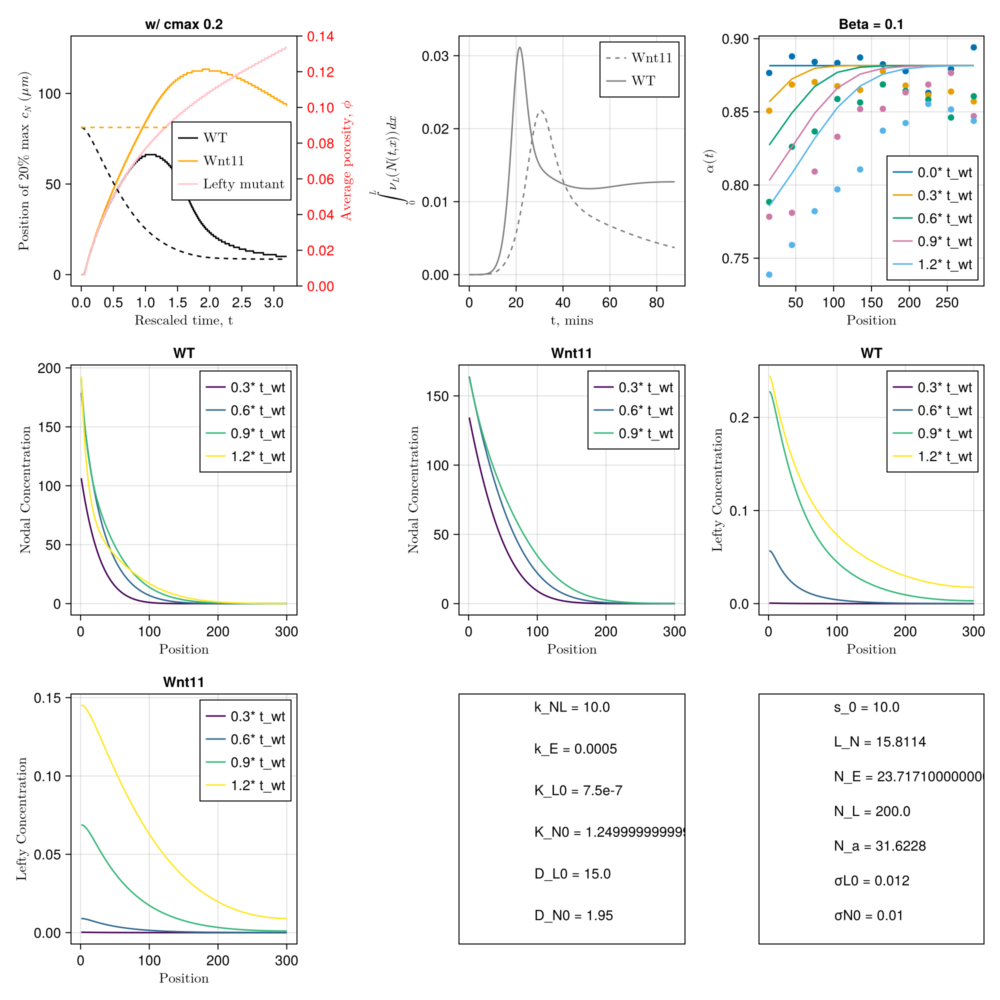

In [144]:
fig = Figure(size = (1000,1000))

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_orig.pdf"),fig)

fig

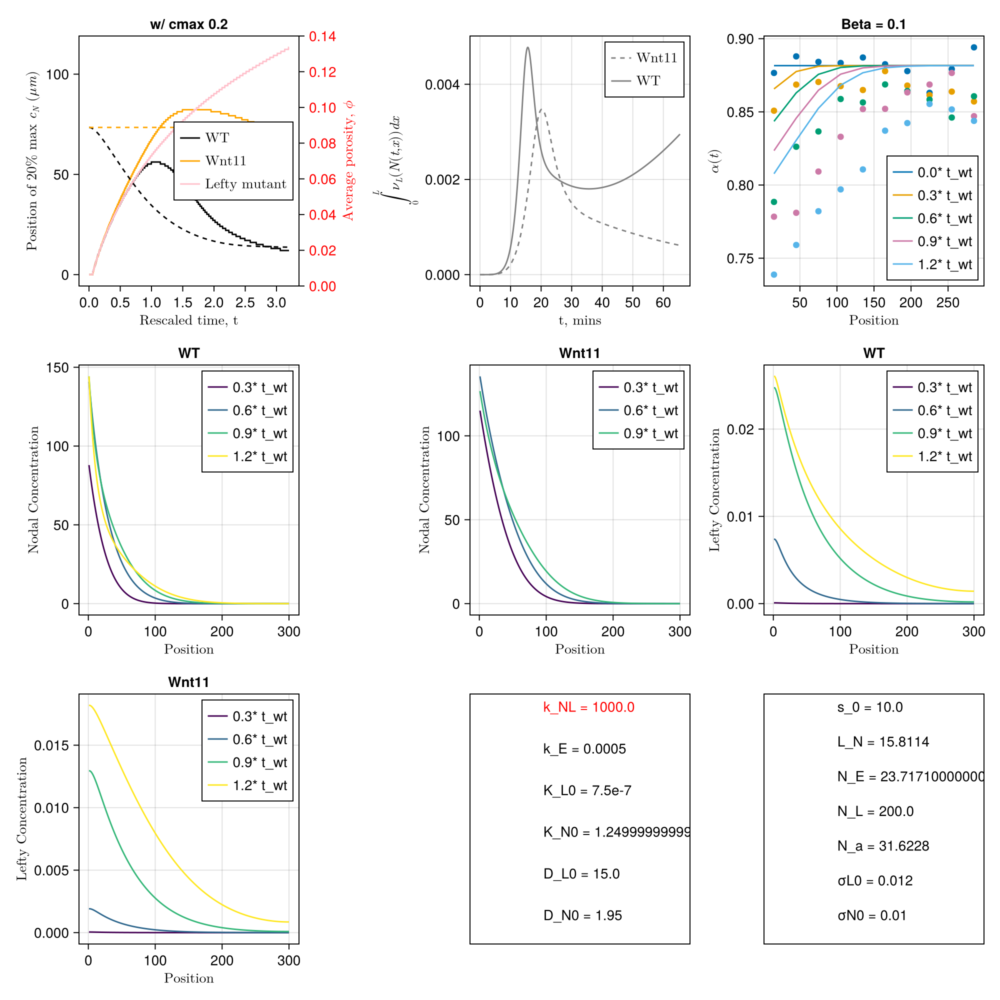

In [145]:
fig = Figure(size = (1000,1000))

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,100*kNL,σN0,σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_P1.pdf"),fig)

fig

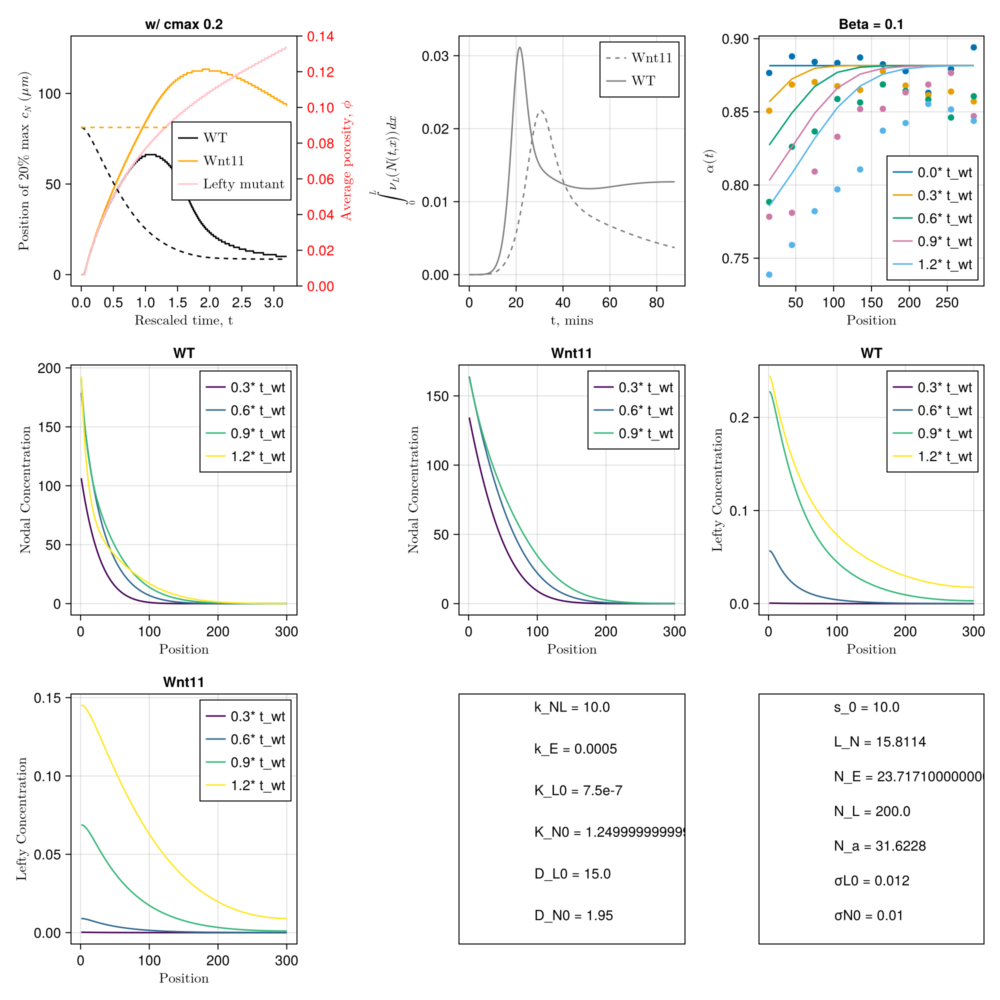

In [146]:
fig = Figure(size = (1000,1000))

β = 1.

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_Beta1.pdf"),fig)

fig

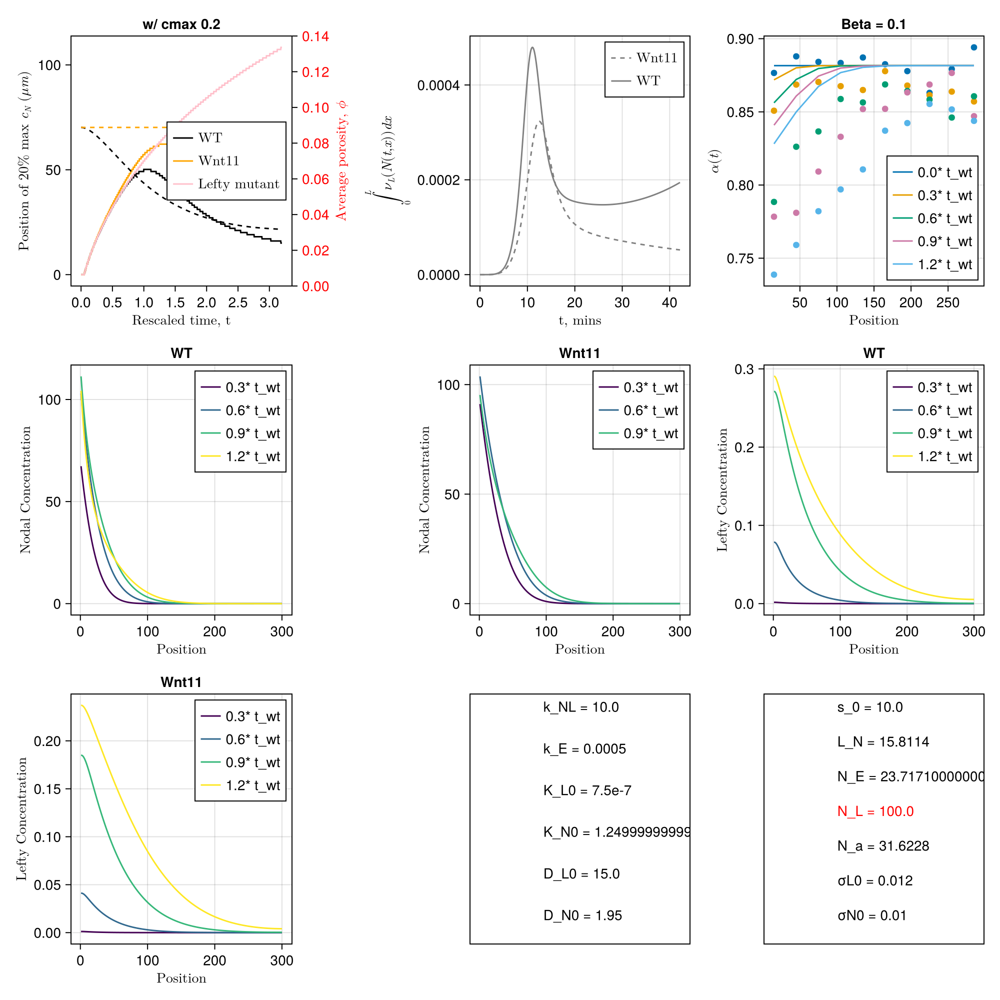

In [147]:
fig = Figure(size = (1000,1000))

β = 0.1

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,0.5*NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_P2.pdf"),fig)

fig

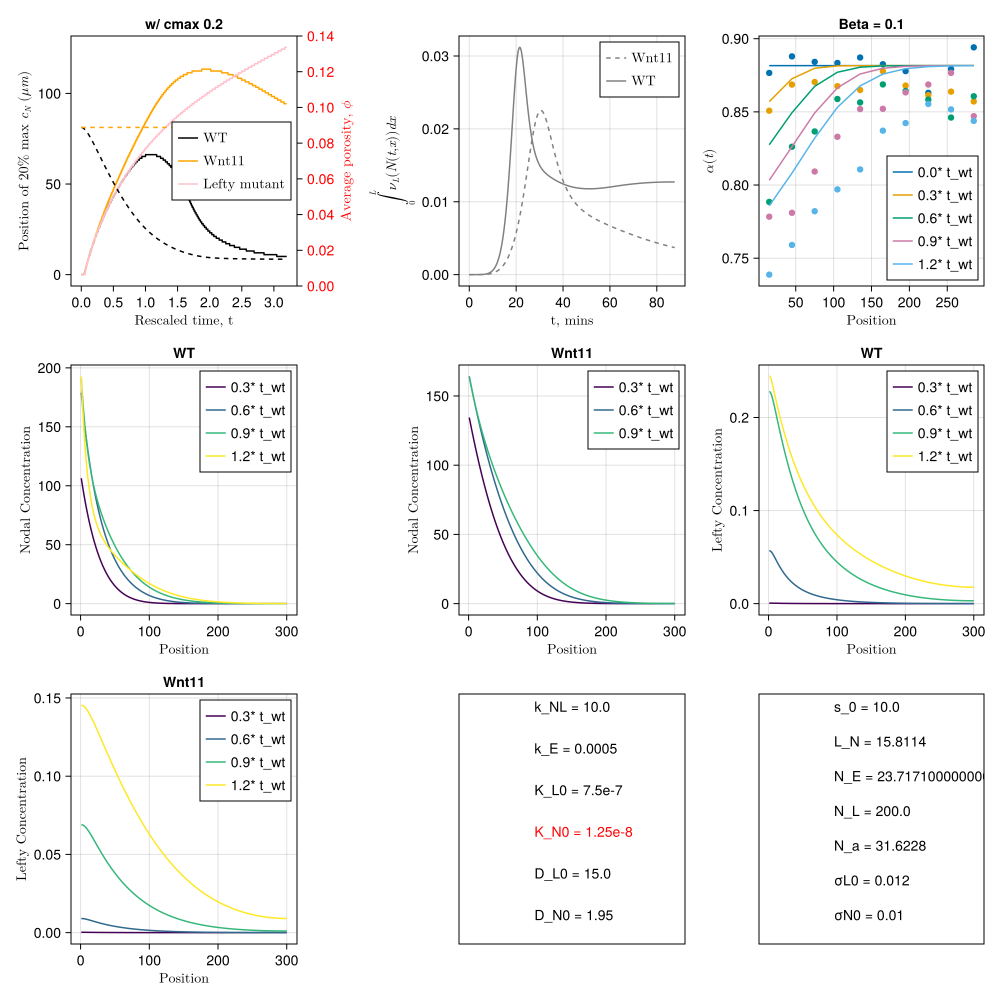

In [148]:
fig = Figure(size = (1000,1000))

β = 0.1

fig = plot_summary!(fig,[DN0,DL0,0.01*kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_P3.pdf"),fig)

fig

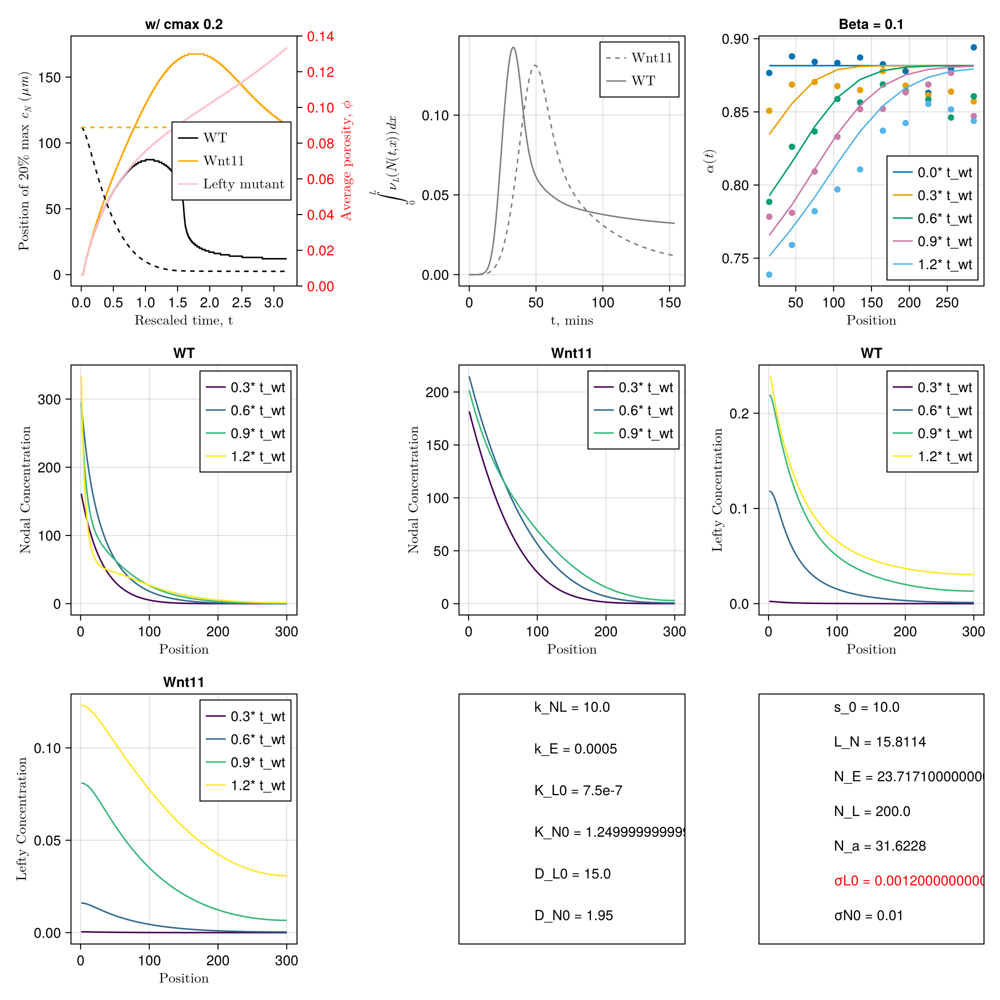

In [151]:
fig = Figure(size = (1000,1000))

β = 0.1

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,kNL,σN0,0.1*σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_P4.pdf"),fig)

fig

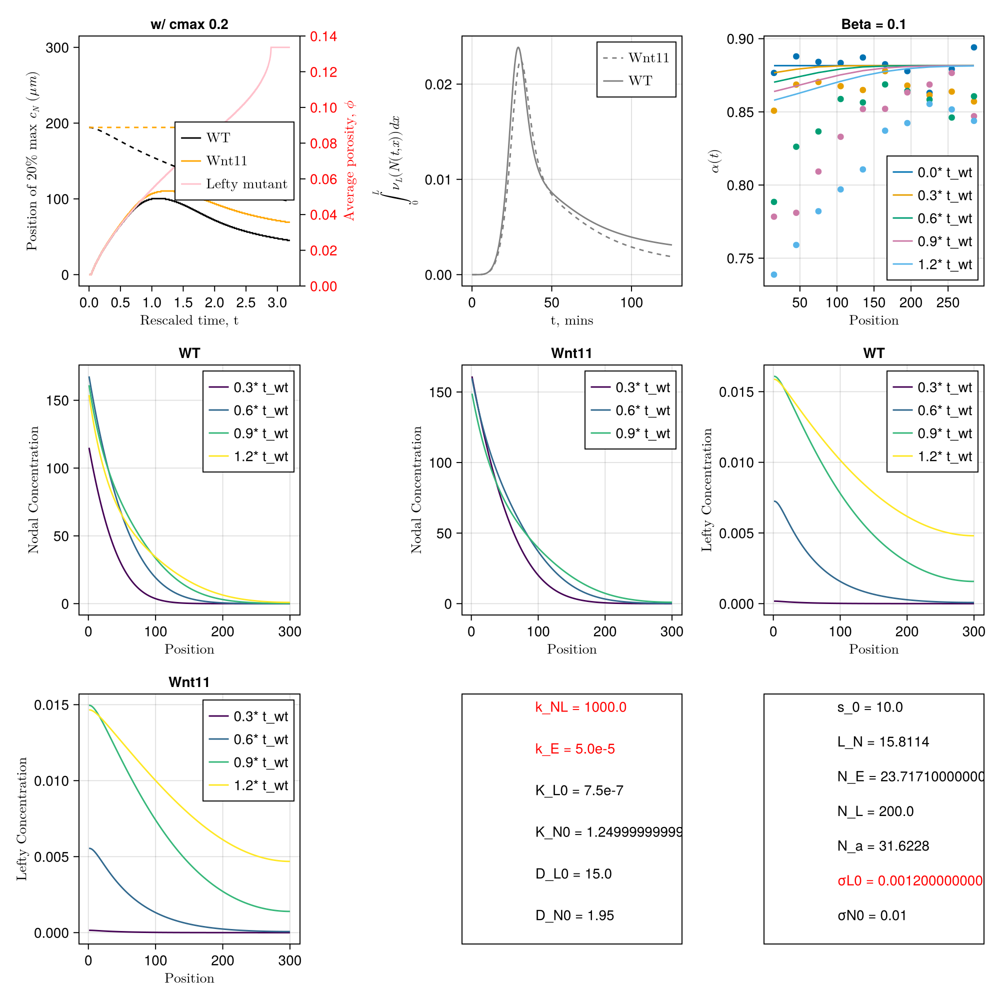

In [153]:
fig = Figure(size = (1000,1000))

β = 0.1

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,0.1*kE,100*kNL,σN0,0.1*σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OptFits/Summary_P4.pdf"),fig)

fig

In [58]:
p_opt_metrics = get_summary_metrics(ro,prob,data,alpha_data,0.2)

(wt_t0 = 1367.6158534495569, cp_t0 = 2188.1853655192913, wt_xMax = 48.16053511705686, cp_xMax = 88.29431438127091, lm_xMax = 195.65217391304347, wt_d0 = 0.0625, cp_d0 = 0.375, lm_d0 = 1.0, xmax_peak_ratio = 1.6, xmax_mse = (0.0908473656932911, 0.5743162675801619), xmax_mse_half = (0.0908473656932911, 0.05703535127497396), alpha_mse = 0.002406900034725765, cp_lprod_t0 = 2461.7085362092025, wt_lprod_t0 = 1367.6158534495569, retcodes = (SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated))

In [158]:
ro_tuple,ro_cp_tuple,ro_lm_tuple = get_params(ro)

((DN0 = 2.145, DL0 = 16.0, kN0 = 1.125e-5, kL0 = 6.75e-6, kE = 0.00048, kNL = 255.0, σN0 = 0.041, σL0 = 0.112, Na = 61.6228, NL = 200.0, NE = 2.37171, mN = 2, mL = 8, mNL = 2, LN = 55.81139999999999, s0 = 4.99), (DN0 = 2.145, DL0 = 16.0, kN0 = 1.125e-5, kL0 = 6.75e-6, kE = 0.00048, kNL = 255.0, σN0 = 0.041, σL0 = 0.112, Na = 61.6228, NL = 200.0, NE = 1.0e8, mN = 2, mL = 8, mNL = 2, LN = 55.81139999999999, s0 = 4.99), (DN0 = 2.145, DL0 = 16.0, kN0 = 1.125e-5, kL0 = 6.75e-6, kE = 0.00048, kNL = 0.0, σN0 = 0.041, σL0 = 0.112, Na = 61.6228, NL = 200.0, NE = 2.37171, mN = 2, mL = 8, mNL = 2, LN = 55.81139999999999, s0 = 4.99))

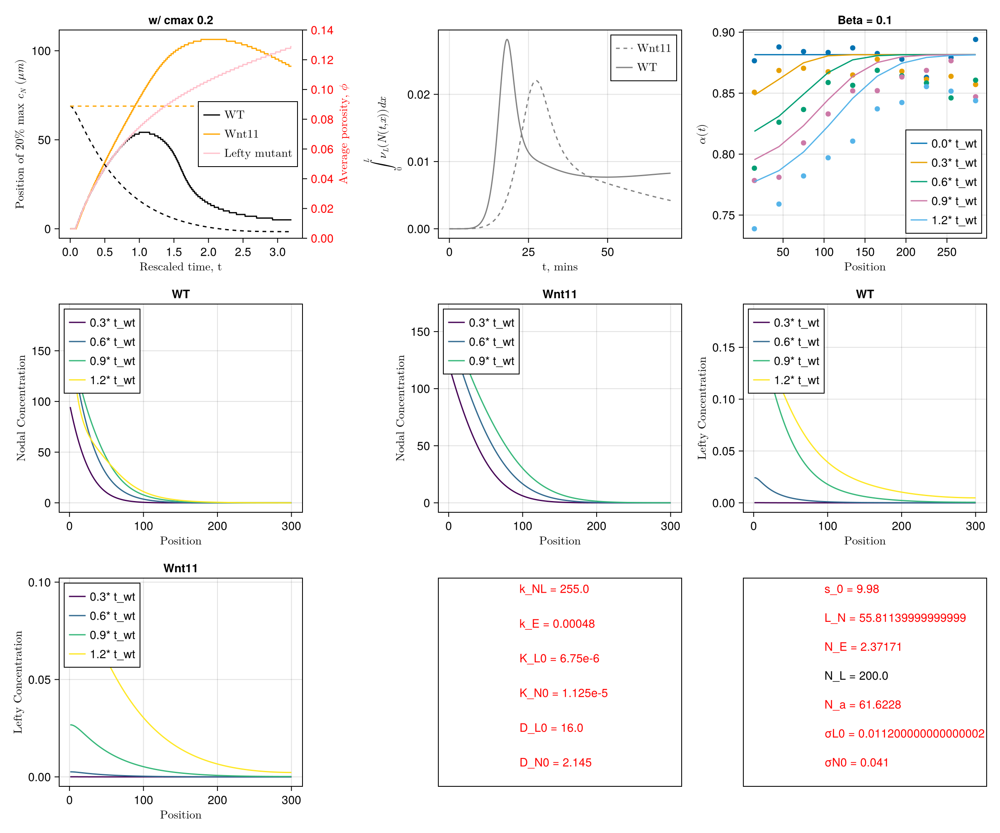

In [159]:
fig = Figure(size = (1200,1000))

fig = plot_summary!(fig,[ro_tuple[:DN0],ro_tuple[:DL0],ro_tuple[:kN0],ro_tuple[:kL0],ro_tuple[:kE],ro_tuple[:kNL],ro_tuple[:σN0],0.1*ro_tuple[:σL0],ro_tuple[:Na],ro_tuple[:NL],ro_tuple[:NE],ro_tuple[:LN],ro_tuple[:s0]],prob)

fig

In [161]:
fig = Figure(size = (1200,1000))

fig = plot_summary!(fig,[ro_tuple[:DN0],ro_tuple[:DL0],ro_tuple[:kN0],ro_tuple[:kL0],ro_tuple[:kE],ro_tuple[:kNL],ro_tuple[:σN0],0.05*ro_tuple[:σL0],ro_tuple[:Na],ro_tuple[:NL],ro_tuple[:NE],ro_tuple[:LN],ro_tuple[:s0]],prob)

fig

In [59]:
sol = solve(prob, p = p_opt, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_lm = solve(prob, p = p_cp_opt, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_cp = solve(prob, p = p_lm_opt, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

In [60]:
(t_grid_alpha,dyn_alpha),(t_plot,(level_x_wt_rescaled,level_x_cp_rescaled,level_x_lm_rescaled )),(porosity_dyn,porosity_dyn_cp),c_level,(sol,sol_cp,sol_lm) = get_alpha_xmax_lambda(pv_orig,prob,0.2);

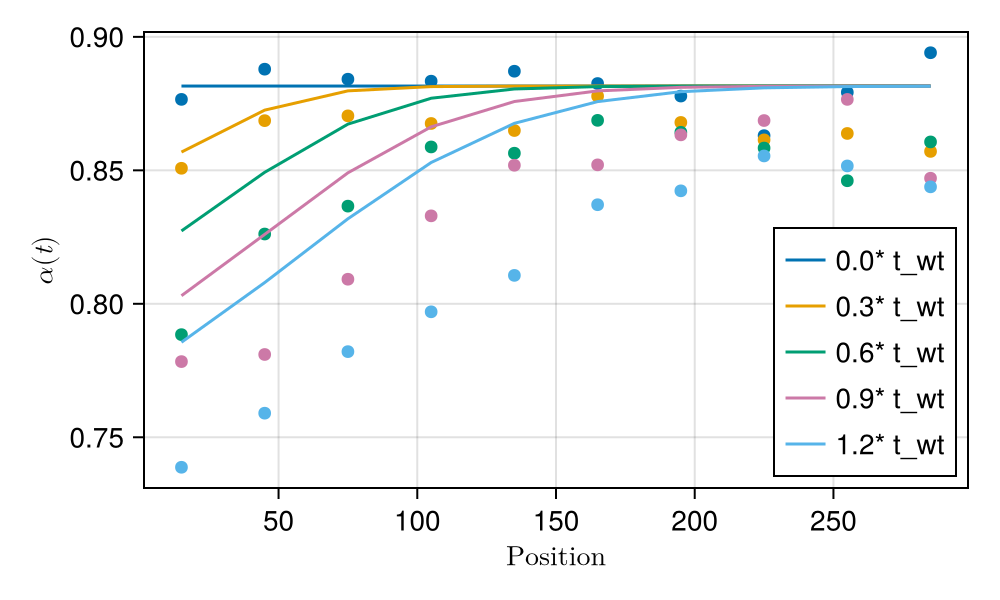

In [61]:
fig = Figure(size = (500,300))

ax = Axis(fig[1,1], xlabel = L"\text{Position}", ylabel= L"α(t)" )

for (n,d) in enumerate(dyn_alpha)
    lines!(ax,alpha_x,d, label = string(alpha_data_times_norm[n])* "* t_wt")
    scatter!(ax,alpha_x,alpha_data[:,n+1])
end

axislegend(ax,position = :rb)

save(plotsdir(exp_name * "/OptFits/Alpha_over_time.pdf"),fig)

fig

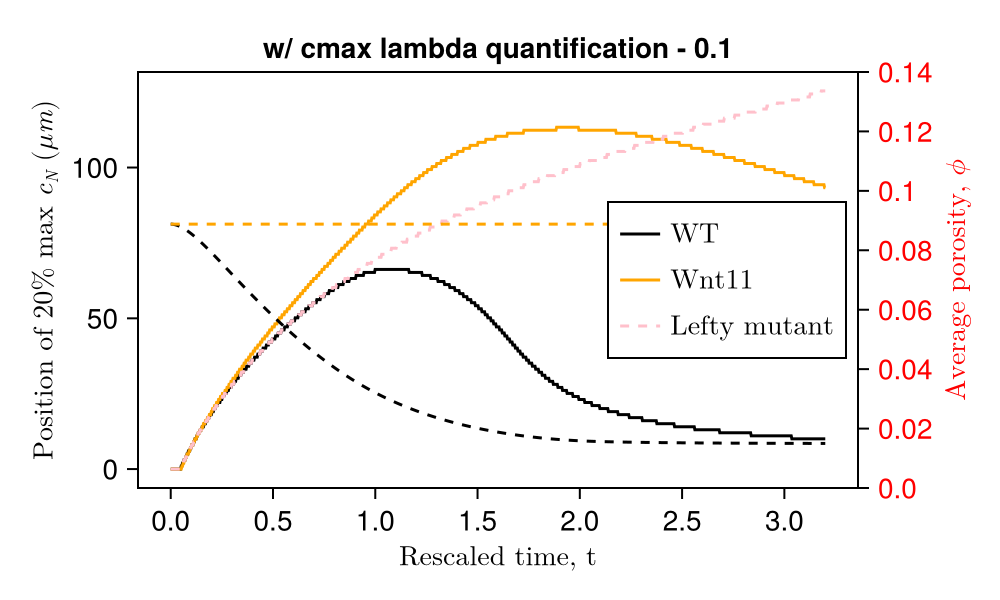

In [65]:
fig = Figure(size = (500,300))

ax = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Position of 20% max } c_N \text{ } (μm) ",ygridvisible = false,xgridvisible = false,title = "w/ cmax lambda quantification - 0.1")
ax_por = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"\text{Average porosity, } \phi", yaxisposition = :right,ylabelcolor = :red,yticklabelcolor = :red,ygridvisible = false,xgridvisible = false,xticksvisible = false)

hidexdecorations!(ax_por)

lines!(ax,t_plot,level_x_wt_rescaled,color = :black,label = L"\text{WT}")
lines!(ax,t_plot,level_x_cp_rescaled,color = :orange,label = L"\text{Wnt11}")
lines!(ax,t_plot,level_x_lm_rescaled,linestyle = :dash,color = :pink,label = L"\text{Lefty mutant}")

lines!(ax_por,t_plot,porosity_dyn ,linestyle = :dash,color = :black,label = L"\text{ϕ}")
lines!(ax_por,t_plot,porosity_dyn_cp ,linestyle = :dash,color = :orange,label = L"\text{ϕ}")

# lines!(ax,exp_times_times_norm ,data[:,"SLB"],color = :blue)
# lines!(ax,exp_times_times_norm ,data[:,"WT"],color = :black)

axislegend(ax,position = :rc)

ylims!(ax_por,0.,0.14)
# ylims!(ax,0.,300)
ax.xticks = (0:0.5:3.5,string.(0:0.5:3.5))

ax_por.yticks = (0:0.02:0.14,string.(0:0.02:0.14))

save(plotsdir(exp_name * "/OptFits/Fig3E_xmax_over_time.pdf"),fig)

# (DN0 = 1.945, DL0 = 14.98, kN0 = 1.25e-7, kL0 = 7.6e-7, kE = 0.00051, kNL = 9.99, σN0 = 0.1, σL0 = 0.0012, Na = 316.228, NL = 1000.0, NE = 23.61709999999997, mN = 2, mL = 8, mNL = 2, LN = 1.58114, s0 = 28.0)

fig

In [66]:
p_opt

(DN0 = 1.945, DL0 = 14.98, kN0 = 1.25e-7, kL0 = 7.6e-7, kE = 0.00051, kNL = 9.99, σN0 = 0.1, σL0 = 0.0012, Na = 316.228, NL = 1000.0, NE = 23.61709999999997, mN = 2, mL = 8, mNL = 2, LN = 1.58114, s0 = 28.0)

In [ ]:
safesave("OptimizationRuns/" * exp_name * ".jld2", Dict("Params"=>ro,"Obj" => obj))

In [ ]:
# to_plot = [:wt_t0,:cp_t0,:xmax_peak_ratio,:wt_xMax,:cp_xMax,:wt_d0,:cp_d0,:lm_d0,:alpha_mse]

# fig = Figure(size = (760,760))

# grid_ax = Tuple.(findall(x->x>0,ones(3,3)))

# for (n,metric) in enumerate(to_plot)
#     if metric  == :alpha_mse
#         ax = Axis(fig[grid_ax[n]...],xlabel = metric_names_latex[metric],xscale = log10)
#         hist!(ax,map(x->transformations[metric](x[metric]),sim_res),normalization = :probability,color = (:grey,0.6),bins = 50)
#         vlines!(ax,transformations[metric](orig_metrics[metric]),color = :blue,linestyle = :dash)
#         vlines!(ax,transformations[metric](p_opt_metrics[metric]),color = :green,linestyle = :dash)
#     else
#         ax = Axis(fig[grid_ax[n]...],xlabel = metric_names_latex[metric])
#         hist!(ax,map(x->transformations[metric](x[metric]),sim_res),normalization = :probability,color = (:grey,0.6))
#         vlines!(ax,transformations[metric](data_metrics[metric]),color = :red,linestyle = :dash, label = L"\text{Experiment}")
#         vlines!(ax,transformations[metric](orig_metrics[metric]),color = :blue,linestyle = :dash, label = L"\text{Start param.}")
#         vlines!(ax,transformations[metric](p_opt_metrics[metric]),color = :green,linestyle = :dash, label = L"\text{Opt param.}")
#     end

#     if metric == :xmax_peak_ratio
#         axislegend(ax,position = :rt)
#     end

# end

# save(plotsdir(exp_name * "/OptFits/Summary_metrics.pdf"),fig)

# fig

In [ ]:
ro_pow,obj_pow = optimize_params(prob,0.1,pv_orig,lb_pow,ub_pow,200)

In [ ]:
p_opt